# Practical 3: "Putting it all together" - `numpy`, random sampling with `numpy`, plotting, vectorization



### Writing output to a file

We often need to store the output of our programs in data files. Below is an example of how to write to a text file (.txt). First we open the file. Next, we write strings to the file line by line. When we are done, we close the file. If you run the cell below, you will find a file in today's lecture directory that is called `test_file.txt`.


In [1]:
# Example code -- how to write to a file -- you'll need to know this for the exercise below.

# First we open the file we are writing to -- in this case, the file is named test_file.txt. 
# With the extension .txt it is a text file
result = open("test_file.txt", "w")

# Next we write the first line to this file. \n indicates that the next line we write should be a new line
result.write("We are in the course "+"PHY426.\n")

# We write the next line to this file. It's also the last line, so we don't need to end with \n
result.write("This is Lecture "+str(8)+".")

# We are done writing, so we close the file. You can check in the Jupyterhub folder that this file is there.
result.close()

### Operations on Arrays in `numpy` - Vectorization

One advantage of `numpy` is that it allows us to *vectorize*. Vectorization refers to applying an operation to an entire array, rather than just a single value (a scalar). This allows our programs to run much faster. For example, it would be faster to use `numpy` to compute the square root of every number in an array instead of writing a `for` loop that loops over each value to compute the square root of each element one by one. For the programs we're writing in this course, you might not notice the speed up. However, using vectorization often makes your code more readable too -- and that's another advantage. Here's an example of two programs that do the same thing -- compute solutions of the quadratic equation -- first, without vectorization; next, using vectorization. Compare the two programs.


In [2]:
import numpy as np

# a, b, and c have the usual definitions in the quadratic formula
b = 2
c = -1

# we will compute solutions for a range of different values of a between 1 and 9
# first we create an array of these values using arange 
values_of_a = np.arange(1, 10, 1)
print(values_of_a)

# use a for loop to find a solution corresponding
for a in values_of_a:
    x1 = (-b + np.sqrt(b**2 - 4*a*c))/(2*a)
    x2 = (-b - np.sqrt(b**2 - 4*a*c))/(2*a)
    print("For an a value of",str(a)+", the solutions are",round(x1,3),"and",str(round(x2,3))+".")


[1 2 3 4 5 6 7 8 9]
For an a value of 1, the solutions are 0.414 and -2.414.
For an a value of 2, the solutions are 0.366 and -1.366.
For an a value of 3, the solutions are 0.333 and -1.0.
For an a value of 4, the solutions are 0.309 and -0.809.
For an a value of 5, the solutions are 0.29 and -0.69.
For an a value of 6, the solutions are 0.274 and -0.608.
For an a value of 7, the solutions are 0.261 and -0.547.
For an a value of 8, the solutions are 0.25 and -0.5.
For an a value of 9, the solutions are 0.24 and -0.462.


In [3]:
import numpy as np

# a, b, and c have the usual definitions in the quadratic formula
b = 2
c = -1

# we will compute solutions for a range of different values of a between 1 and 9
# first we create an array of these values using arange 
values_of_a = np.arange(1, 10, 1)

# Here is the array of a values
print(values_of_a)

# Next, we use arrays x1 and x2 to contain the solutions for each value of a
# Python "knows" that values_of_a is an array
# Thus, x1 and x2 are also arrays
x1 = (-b + np.sqrt(b**2 - 4*values_of_a*c))/(2*values_of_a)
x2 = (-b - np.sqrt(b**2 - 4*values_of_a*c))/(2*values_of_a)

# Here are the arrays of solutions
print(x1)
print(x2)

# If we want formatted print statements as in the above example, then we need to refer to the elements in these arrays
for i in range(0,9):
    print("For an a value of",str(values_of_a[i])+", the solutions are",round(x1[i],3),"and",str(round(x2[i],3))+".")

[1 2 3 4 5 6 7 8 9]
[0.41421356 0.3660254  0.33333333 0.30901699 0.28989795 0.27429189
 0.26120387 0.25       0.24025307]
[-2.41421356 -1.3660254  -1.         -0.80901699 -0.68989795 -0.60762522
 -0.54691816 -0.5        -0.4624753 ]
For an a value of 1, the solutions are 0.414 and -2.414.
For an a value of 2, the solutions are 0.366 and -1.366.
For an a value of 3, the solutions are 0.333 and -1.0.
For an a value of 4, the solutions are 0.309 and -0.809.
For an a value of 5, the solutions are 0.29 and -0.69.
For an a value of 6, the solutions are 0.274 and -0.608.
For an a value of 7, the solutions are 0.261 and -0.547.
For an a value of 8, the solutions are 0.25 and -0.5.
For an a value of 9, the solutions are 0.24 and -0.462.


What's happening in the above code:

- Let's look at the line `x1 = (-b + np.sqrt(b**2 - 4*values_of_a*c))/(2*values_of_a)`
- Python's order of operations starts with the innermost expression: `(b**2 - 4*values_of_a*c)` 
- `b` is defined to be 2, so `b**2` is 4
- Next, Python computes `4*values_of_a`. Python knows that `values_of_a` is an array. `4*values_of_a` results in array with the same dimensions as `values_of_a` with each element of the array multiplied by 4.
- The result of `4*values_of_a*c` is an array with the same dimensions, now with each element in the array multiplied by `c`, which is defined to be -1.
- The next step in computing `x1` is to compute `(b**2 - 4*values_of_a*c)`. This also results in an array, and the elements of this array would be: `(b**2 - 4*values_of_a[i]*c)` where `i` is an index.
- `np.sqrt` also acts on an array -- it will take the square root of each element in the array. Note, this wouldn't work for `math.sqrt`, which doesn't act on arrays.
- Python then adds `-b` to each element of the array
- Python then divides each element of the array by the corresponding element of the array `2*values_of_a`. This is an example of a general rule: 
    - When two NumPy arrays *with the same shape* are joined using arithmetic operations `+`, `-`,`*`,`/`, or `**`, Python carries out this operation on every pair of elements in the two arrays, and the resulting array has the same shape as the original arrays.
- To see this for yourself, you can modify the above code to carry out each operation in computing `x1` one by one and printing the resulting array at each step.
- Note, the above would not work with lists. As an example -- `number*list` results in a list duplicated `number` times.

In [4]:
values_of_a = [1, 2, 3, 4, 5, 6, 7, 8, 9]
result= 4*values_of_a
print(result)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9]


You will find additional examples of vectorization here:

https://www.geeksforgeeks.org/vectorization-in-python/

These examples include timers in the code to show the improvement in performance that results from using vectorization e.g. to compute the dot product. 

## **Question 1**:  The Biased Coin Problem

We often encounter systems (in physics and in science in general) for which we lack complete knowledge. In these cases, we might know the probabilities of simple events. For example, we know the probability of any outcome in the roll of a single die is 1/6. However, we might like to know what the probability of the sum of a roll of 20 dice being less than 50 is (if we are at a casino). We can determine these types of probabilities empirically using simulation. As you've seen, random number generators make it possible for us to "roll dice" millions of times per second. We can use these random number generators to simulate physical systems when we know the probability distributions of the relevant parameters. This allows us to predict the most likely behaviour for a system, even in the case that it's impossible to work it out analytically. This is a very powerful use of programming in physics and chemistry. 

![line](biased_coins.jpg)

Image reference: https://izbicki.me/blog/how-to-create-an-unfair-coin-and-prove-it-with-math.html

In the problem you'll work on today, we'll simulate the behaviour of a biased coin, which is an example of a physical system that we can simulate knowing only one probability. The image above shows coins that have been bent in a way that prefers tails over heads. The coin in our example would look something like Coin #5 (this experiment has been done...see the link above). 

Write a program that simulates flipping a weighted (biased) coin. Your coin should, on average, come up heads only once every 4 flips.

In your program:

(a) Carry out 10,000 repeat 'experiments'. Each of these experiments consists of flipping the coin 100 times. Make a histogram of the number of flips that come up heads. Set Density=True (normalize the histogram to make a probability density plot). Compute the average and standard deviation of the number of flips that come up heads. Add these values as text labels on your histogram plot.

(b) Carry out different numbers of repeat experiments (5, 10, 50, 100, 300, 500, 700, 1000, 2000, 3000, 4000, 5000, 6000), each of which consists of flipping the coin 100 times. Use a `for` loop. Compute the % of flips that come up heads in each case. Make a plot of the % of flips that come up heads as a function of the number of experiments. 

(c) Simulate flipping the coin 10,000 times. Compute the average waiting time (# of flips) between heads. Write out this result to a text file.

(d) Compute the time needed to execute each part (parts (a), (b) and (c)) of your program using `perf_counter`. Write out the results to a text file.

- If your program uses any external functions, make sure that you include the necessary `import` statements.  
- You will probably find it helpful to use `for` loops and `if` statements in your program. You might also find that it is useful to define a function in your program.
- The program should contain comments explaining each line of code.  
- All plots should have axis labels, a title, and be saved as a .png file. 
- Relevant documentation: https://docs.scipy.org/doc/numpy-1.14.0/reference/routines.random.html


**Introduction: Random Walks**

A random walk consists of a series of random steps in space (this may be in one dimension, two dimensions, three dimensions, etc.). Many processes in biology, chemistry, physics, as well as social sciences and finance, can be modelled as random walks.  

Here are some examples:

- in chemistry, the motion of molecules in liquids and gases can be modelled as a random walk
- in biology, random walks have been used to model cascades of neurons firing in the brain.
- in biophysics, the movement of bacterial cells can be modelled as a biased random walk (the cells are moving on average towards food sources, for example)

Here is an example of a random walk in two dimensions with 2500 steps:
![2D random walk](2560px-Random_walk_2500.png)

The particle is moving in two dimensions by taking steps randomly: at each step, the particle can move left or right and up or down. Each step has the same size (one square in this case). 

You can see this random walk as an animiation here:
https://upload.wikimedia.org/wikipedia/commons/f/f3/Random_walk_2500_animated.svg

Here is an example with 25000 steps:
![2D random walk](2880px-Random_walk_25000.png)
You can see this random walk as an animiation here:
https://upload.wikimedia.org/wikipedia/commons/c/cb/Random_walk_25000.svg


## **Question 2**: Random Walk in 1-Dimension

In this question, you will write a program that simulates a random walk of a particle in one dimension (x).  

Write a program to simulate the random walk in 1D:

- The particle begins its random walk at x = 0.
- At each step, the particle can move left or right 1 unit of distance (+1 or -1). At each step, use a random number to decide if the particle moves left or right (+x or -x). You will need to use a random number generator. You will also need to use an `if` statement that uses the random number to decide if the particle moves to the left or to the right. Repeat this 1000 times to simulate a random walk with 1000 steps.
- Make a plot showing the particle's x-position vs. step number. This plot should have axis labels, a title, and be saved as a .png file.
- Repeat these steps for random walks with 10000 and 100000 steps. Name the files containing your figures with the number of steps (e.g. "random-walk-1D-1000steps.png").
- If your program uses any external functions, make sure that you include the necessary `import` statements.
- The program should contain comments explaining each line of code.

Hints: 
- You might choose to use the `numpy` function `cumsum`. Read about how this function works here: https://docs.scipy.org/doc/numpy/reference/generated/numpy.cumsum.html. 
- You should use the random number generator in `numpy` (`numpy.random`). You might choose to use the function `numpy.random.randint` to generate random integers. See the documentation here:
https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.random.randint.html

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from time import perf_counter




def generate_walk(N):
    '''
    
    '''
    x = 0
    steps = np.random.choice([-1, 1], N, p=(0.5,0.5))
    return np.cumsum(steps)


N =10000
x = np.arange(0, N)
walk = generate_walk(N)

fig, ax = plt.subplots(figsize=(15.0,10.0))
plt.title("1-Dimensional Walk of {0} steps".format(N), fontsize=20.0)
plt.ylabel('Number of Steps')
plt.xlabel('x Position')
plt.plot(walk, x)
plt.ylim(0, N)



(0, 10000)

## **Question 3**: Random Walk in 2-Dimensions

In this question, you will write a program that simulates a random walk of a particle in two dimensions (x and y). The units of distance are in nanometers (here, we are simulating the motion of a small molecule in 2D). At each step, the particle can move left or right in the x direction (+x or -x), and up or down in the y direction (+y or -y). Diagonal steps are allowed (unlike in the plots shown above). The particle begins its random walk at the origin (0,0).

Write a program that does the following:

- Makes a plot that shows a 2D random walk of your particle. This plot should have a title and appropriate axis labels. Your program should not only display the plot in your Jupyter notebook, but also save the plot as a figure (use the file extension .png). Name the files containing your figures with the number of steps (e.g. "random-walk-500steps.png").
- Repeat this for random walks of length 1000 steps, 5000 steps, 10000 steps, 50000 steps and 100000 steps and 500000 steps. Use a `for` loop to do this.
- If your program uses any external functions, make sure that you include the necessary `import` statements.
- The program should contain comments explaining each line of code.

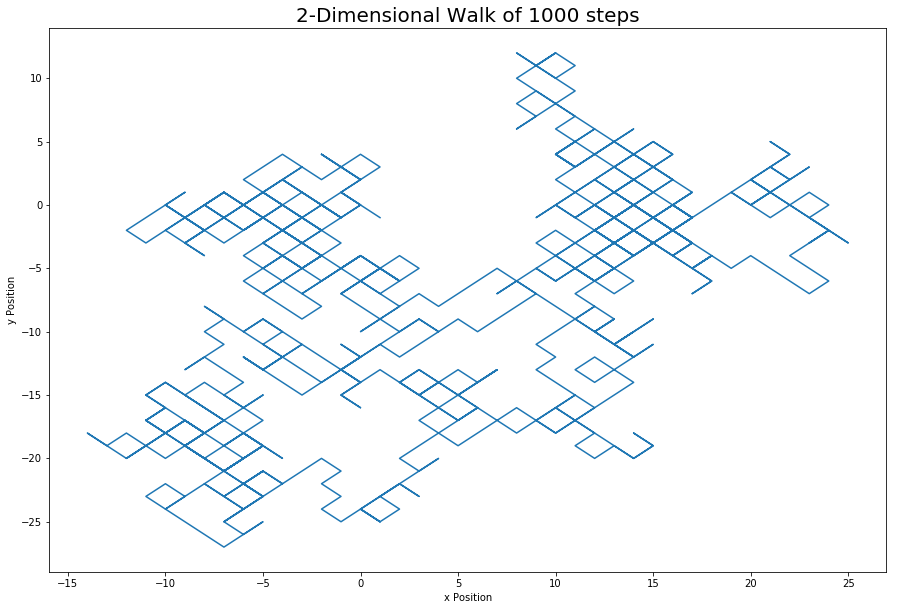

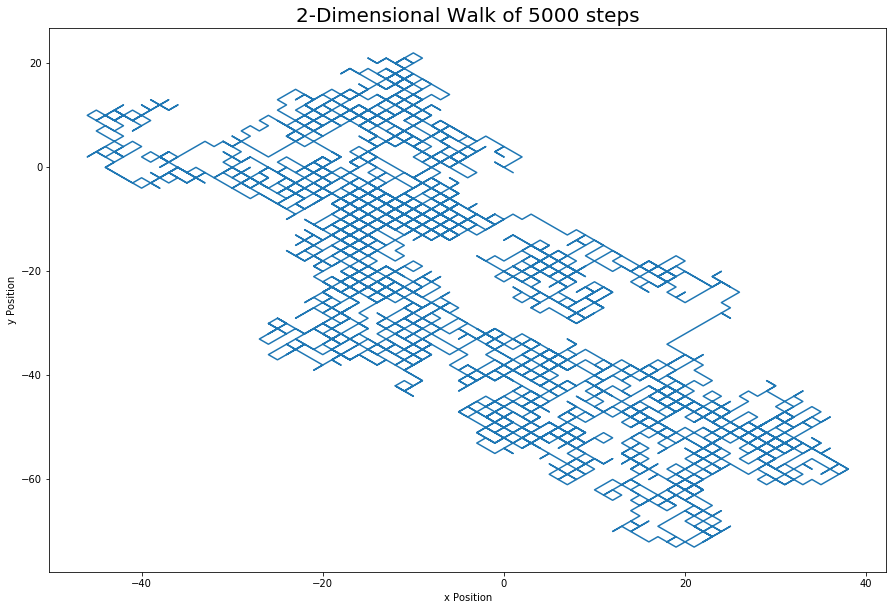

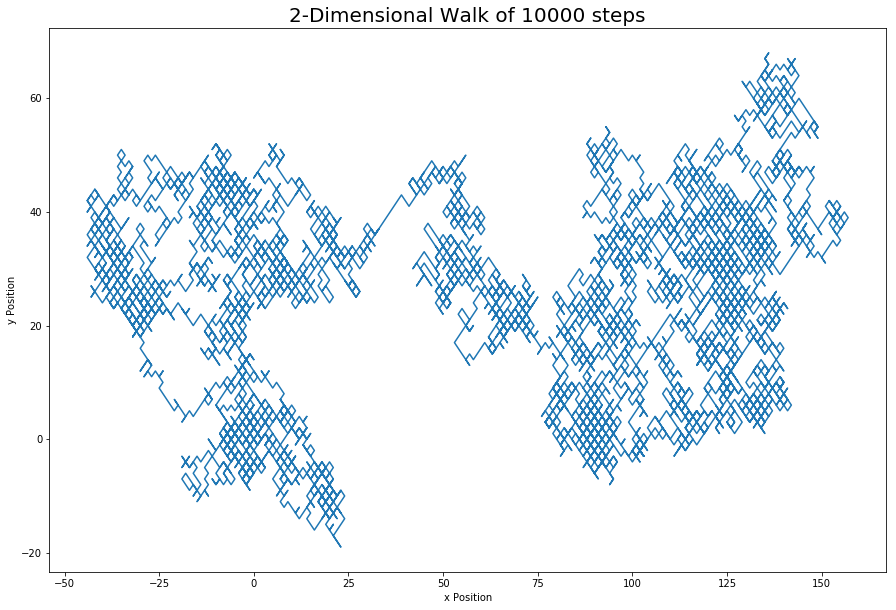

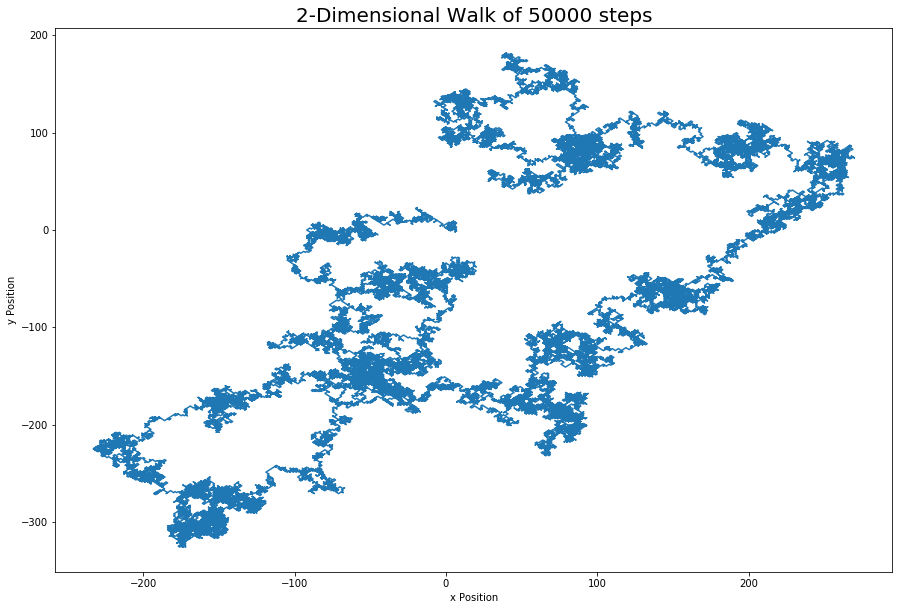

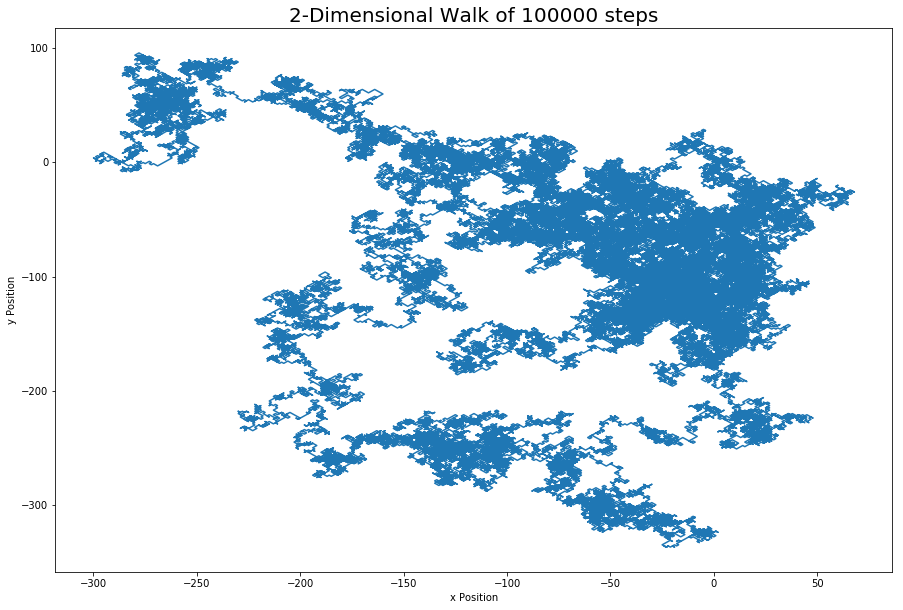

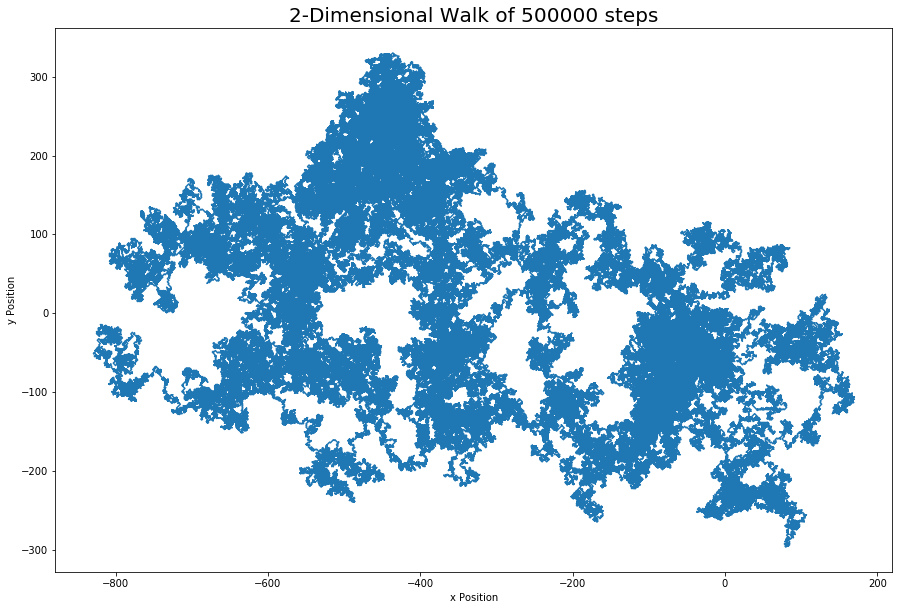

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from time import perf_counter




def generate_walk(N):
    '''
    
    '''
    x = 0
    steps = np.random.choice([-1, 1], N, p=(0.5,0.5))
    return np.cumsum(steps)



steps=[1000,5000,10000,50000,100000,500000]
for step in steps:
    
    x_walk = generate_walk(step)
    y_walk = generate_walk(step)
    
    fig, ax = plt.subplots(figsize=(15.0,10.0))
    plt.title("2-Dimensional Walk of {0} steps".format(step), fontsize=20.0)
    plt.ylabel('y Position')
    plt.xlabel('x Position')
    plt.plot(x_walk, y_walk)
    plt.savefig("random-walk-{0}steps.png".format(str(step)))


## Question 4: Random Walk in 2-Dimensions - animated

Sometimes it is useful to visualize physical data using an animation. We can create an animation using `matplotlib` by creating image files that can be combined into a movie using an encoder. This is analogous to making a flip book (images that can give the illusion of motion when you view them quickly). That's what we're doing here in the next example. Building on the programs we wrote in Q2 & Q3 to simulate a random walk, we are creating an animation of these plots by combining the image files into a single movie file. In the example code below, we are simulating a random walk in 1D which has 500 steps. This code generates a movie called randomwalk_1D.html. If you run the code and open the movie, you will see that each frame of the movie shows the particle's trajectory updated to a certain number of steps.

Your task is to generate a movie for a random walk in 2D that consists of 5000 steps. Your movie should have 250 frames. Each frame of the movie should indicate what the current step number is in the plot title.

Make sure that your code is commented. 

NOTE: The html generated by this program cannot be viewed in Chrome. Firefox and Safari will work. Alternatively, you can look at the individual image files. 




Found 300 files of the format *_movie.jpg.

Making HTML code for displaying 000_movie.jpg, 001_movie.jpg, 002_movie.jpg, 003_movie.jpg, 004_movie.jpg, 005_movie.jpg, 006_movie.jpg, 007_movie.jpg, 008_movie.jpg, 009_movie.jpg, 010_movie.jpg, 011_movie.jpg, 012_movie.jpg, 013_movie.jpg, 014_movie.jpg, 015_movie.jpg, 016_movie.jpg, 017_movie.jpg, 018_movie.jpg, 019_movie.jpg, 020_movie.jpg, 021_movie.jpg, 022_movie.jpg, 023_movie.jpg, 024_movie.jpg, 025_movie.jpg, 026_movie.jpg, 027_movie.jpg, 028_movie.jpg, 029_movie.jpg, 030_movie.jpg, 031_movie.jpg, 032_movie.jpg, 033_movie.jpg, 034_movie.jpg, 035_movie.jpg, 036_movie.jpg, 037_movie.jpg, 038_movie.jpg, 039_movie.jpg, 040_movie.jpg, 041_movie.jpg, 042_movie.jpg, 043_movie.jpg, 044_movie.jpg, 045_movie.jpg, 046_movie.jpg, 047_movie.jpg, 048_movie.jpg, 049_movie.jpg, 050_movie.jpg, 051_movie.jpg, 052_movie.jpg, 053_movie.jpg, 054_movie.jpg, 055_movie.jpg, 056_movie.jpg, 057_movie.jpg, 058_movie.jpg, 059_movie.jpg, 060_movie.jpg, 061_mo

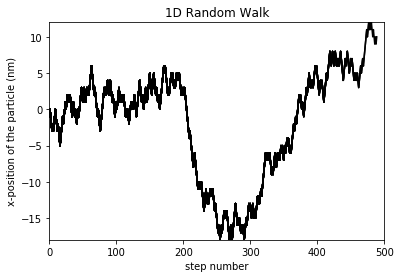

In [7]:
import numpy as np
import matplotlib.pyplot as plt
# The python script in the practical folder contains a function called movie
# that allows us to generate an html movie from a set of images -- 
from html_movie import movie 

# The number of steps in the random walk
nsteps = 500

# The number of frames in the movie
num_frames = 50

# The steps we are skipping between frames of the movie
steps_between_frames = 10



# This defines the file names for the frames of the movie.
# The frames are numbered in order starting with 000
# {:03d} will display integers with three digits and insert zeros if needed:
# '000_movie.jpg', '001_movie.jpg', etc.
# if you need to have more frames in your movie, you will need to modify this line
file_name = "{:03d}_movie.jpg"

# Generate frames and save each figure as a separate .jpg file.
x_position = generate_walk(nsteps)

for i in range(num_frames):
    # plot the x position up to the current x position
    # the time at the current frame of the movie is t = num_frames*steps_between_frames
    t = i*steps_between_frames
    
    # we slice the original array 
    current_x_position = x_position[0:t]
    
    # Create a plot of the particle's position up to the current time with title, axes labels
    plt.plot(current_x_position, c="k")
    plt.xlabel('step number')
    plt.ylabel('x-position of the particle (nm)')
    # We set the limits of this plot so all of the points will be displayed (so the axes don't change
    # during the movie)
    plt.xlim(0,nsteps)
    plt.ylim(np.min(x_position), np.max(x_position))
    
    # Add a title to the plot
    plt.title('1D Random Walk')
    
    # Save the file in the format given above -- number followed by _movie.jpg
    plt.savefig(file_name.format(i)) 

# Use html movie encoder from scitools to create an HTML document that
# will display the frames as a movie. 
# You will be able to open the file movie.html in a Web browser to view it. 
# Use the controls to start the movie.
movie(input_files='*_movie.jpg', output_file='randomwalk_1D.html')





In [8]:
# You can run the next cell to clean up your folder if you are playing around with generating movies 
# and you end up creating many jpg files.
# This is a bash command -- rm means remove
# This will delete all files that end in .jpg from your folder
# rm *movie.jpg

# This deletes the movie file
# rm *html

In [9]:
rm *movie.jpg

In [10]:
rm *html




Found 50 files of the format *_movie.jpg.

Making HTML code for displaying 000_movie.jpg, 001_movie.jpg, 002_movie.jpg, 003_movie.jpg, 004_movie.jpg, 005_movie.jpg, 006_movie.jpg, 007_movie.jpg, 008_movie.jpg, 009_movie.jpg, 010_movie.jpg, 011_movie.jpg, 012_movie.jpg, 013_movie.jpg, 014_movie.jpg, 015_movie.jpg, 016_movie.jpg, 017_movie.jpg, 018_movie.jpg, 019_movie.jpg, 020_movie.jpg, 021_movie.jpg, 022_movie.jpg, 023_movie.jpg, 024_movie.jpg, 025_movie.jpg, 026_movie.jpg, 027_movie.jpg, 028_movie.jpg, 029_movie.jpg, 030_movie.jpg, 031_movie.jpg, 032_movie.jpg, 033_movie.jpg, 034_movie.jpg, 035_movie.jpg, 036_movie.jpg, 037_movie.jpg, 038_movie.jpg, 039_movie.jpg, 040_movie.jpg, 041_movie.jpg, 042_movie.jpg, 043_movie.jpg, 044_movie.jpg, 045_movie.jpg, 046_movie.jpg, 047_movie.jpg, 048_movie.jpg, 049_movie.jpg


movie in output file randomwalk_2D.html


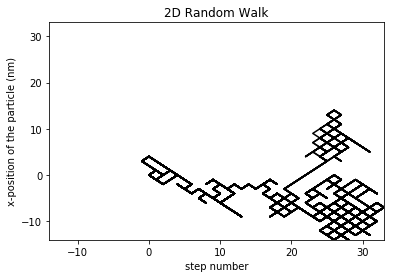

In [11]:
import numpy as np
import matplotlib.pyplot as plt
# The python script in the practical folder contains a function called movie
# that allows us to generate an html movie from a set of images -- 
from html_movie import movie 

# The number of steps in the random walk
nsteps = 500

# The number of frames in the movie
num_frames = 50

# The steps we are skipping between frames of the movie
steps_between_frames = 10



# This defines the file names for the frames of the movie.
# The frames are numbered in order starting with 000
# {:03d} will display integers with three digits and insert zeros if needed:
# '000_movie.jpg', '001_movie.jpg', etc.
# if you need to have more frames in your movie, you will need to modify this line
file_name = "{:03d}_movie.jpg"

# Generate frames and save each figure as a separate .jpg file.
x_position = generate_walk(nsteps)
y_position = generate_walk(nsteps)

max_lim = max(np.max(x_position), np.max(y_position))
min_lim = min(np.min(x_position), np.min(y_position))

for i in range(num_frames):
    # plot the x position up to the current x position
    # the time at the current frame of the movie is t = num_frames*steps_between_frames
    t = i*steps_between_frames
    
    # we slice the original array 
    current_x_position = x_position[0:t]
    current_y_position = y_position[0:t]
    
    # Create a plot of the particle's position up to the current time with title, axes labels
    plt.plot(current_x_position, current_y_position, c="k")
    plt.xlabel('step number')
    plt.ylabel('x-position of the particle (nm)')
    # We set the limits of this plot so all of the points will be displayed (so the axes don't change
    # during the movie)
    plt.xlim(min_lim, max_lim)
    plt.ylim(min_lim, max_lim)
    
    # Add a title to the plot
    plt.title('2D Random Walk')
    
    # Save the file in the format given above -- number followed by _movie.jpg
    plt.savefig(file_name.format(i)) 

# Use html movie encoder from scitools to create an HTML document that
# will display the frames as a movie. 
# You will be able to open the file movie.html in a Web browser to view it. 
# Use the controls to start the movie.
movie(input_files='*_movie.jpg', output_file='randomwalk_2D.html')





## Question 5: Create your own visualization of data 

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Found 300 files of the format *_movie.jpg.

Making HTML code for displaying 000_movie.jpg, 001_movie.jpg, 002_movie.jpg, 003_movie.jpg, 004_movie.jpg, 005_movie.jpg, 006_movie.jpg, 007_movie.jpg, 008_movie.jpg, 009_movie.jpg, 010_movie.jpg, 011_movie.jpg, 012_movie.jpg, 013_movie.jpg, 014_movie.jpg, 015_movie.jpg, 016_movie.jpg, 017_movie.jpg, 018_movie.jpg, 019_movie.jpg, 020_movie.jpg, 021_movie.jpg, 022_movie.jpg, 023_movie.jpg, 024_movie.jpg, 025_movie.jpg, 026_movie.jpg, 027_movie.jpg, 028_movie.jpg, 029_movie.jpg, 030_movie.jpg, 031_movie.jpg, 032_movie.jpg, 033_movie.jpg, 034_movie.jpg, 035_movie.jpg, 036_movie.jpg, 037_movie.jpg, 038_movie.jpg, 039_movie.jpg, 040_movie.jpg, 041_movie.jpg, 042_movie.jpg, 043_movie.jpg, 044_movie.jpg, 045_movie.jpg, 046_movie.jpg, 047_movie.jpg, 048_movie.jpg, 049_movie.jpg, 050_movie.jpg, 051_movie.jpg, 052_movie.jpg, 053_movie.jpg, 054_movie.jpg, 055_movie.jpg, 056_movie.jpg, 057_movie.jpg, 058_movie.jpg, 059_movie.jpg, 060_movie.jpg, 061_mo

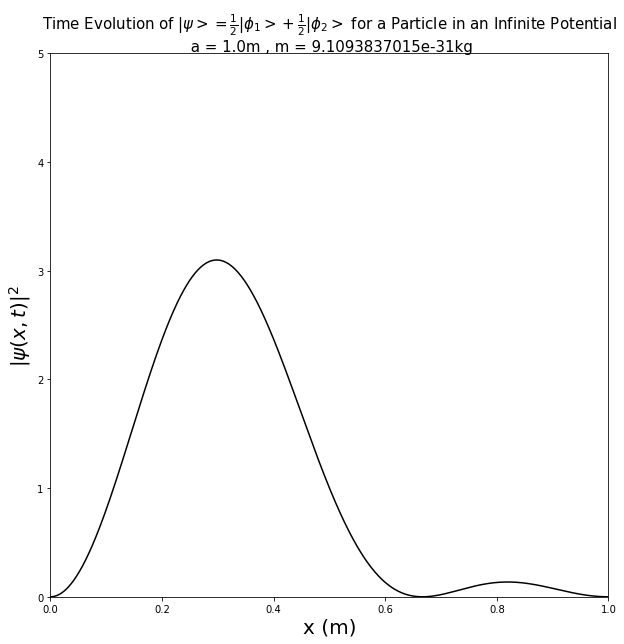

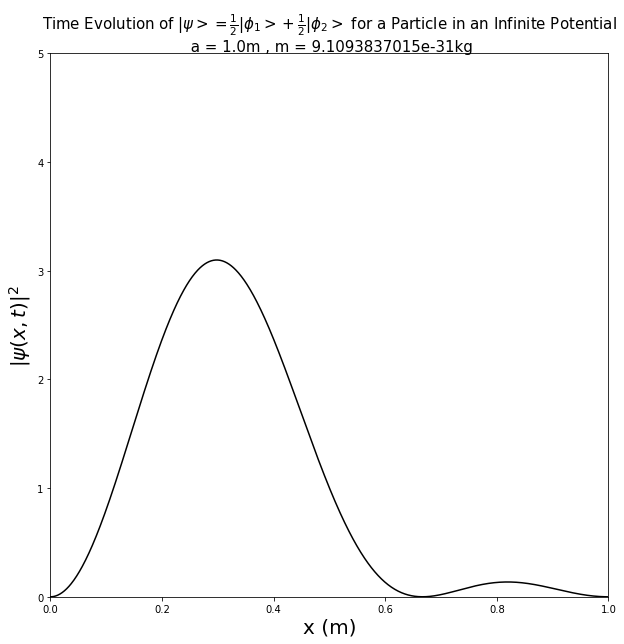

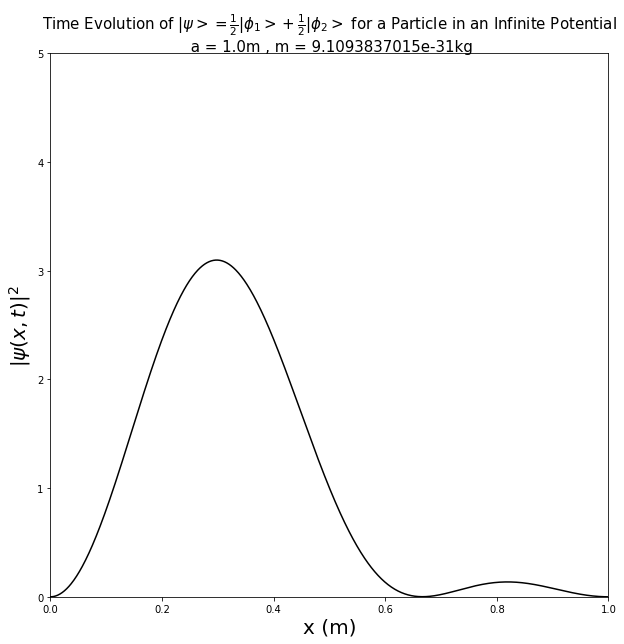

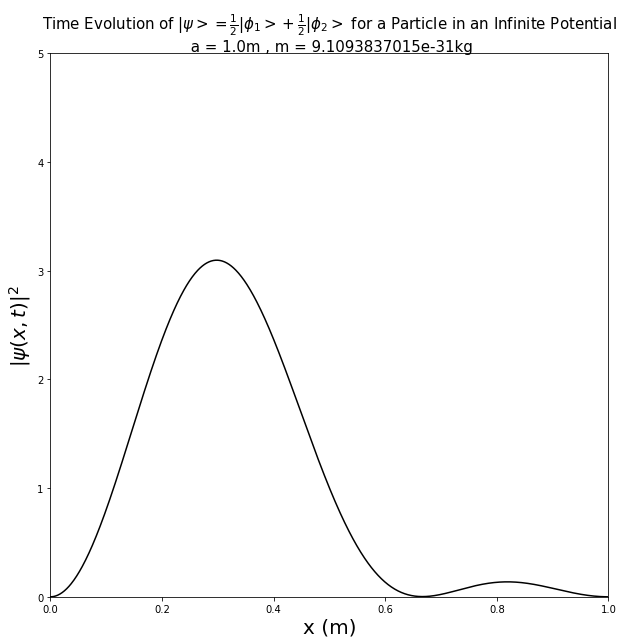

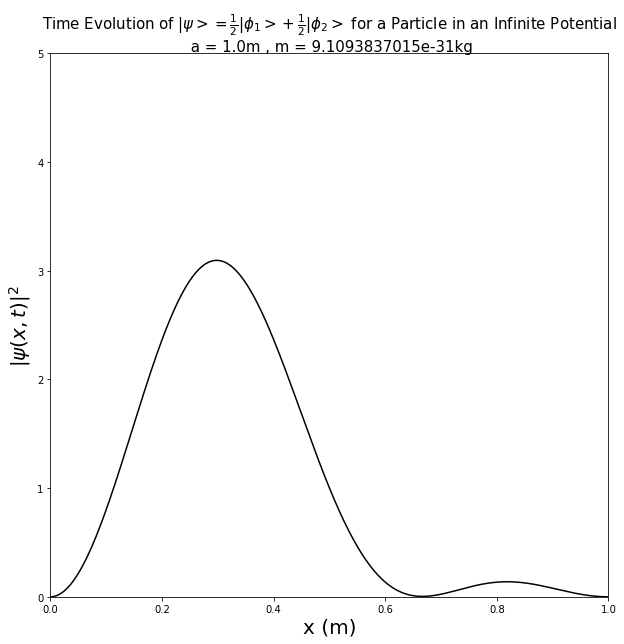

...

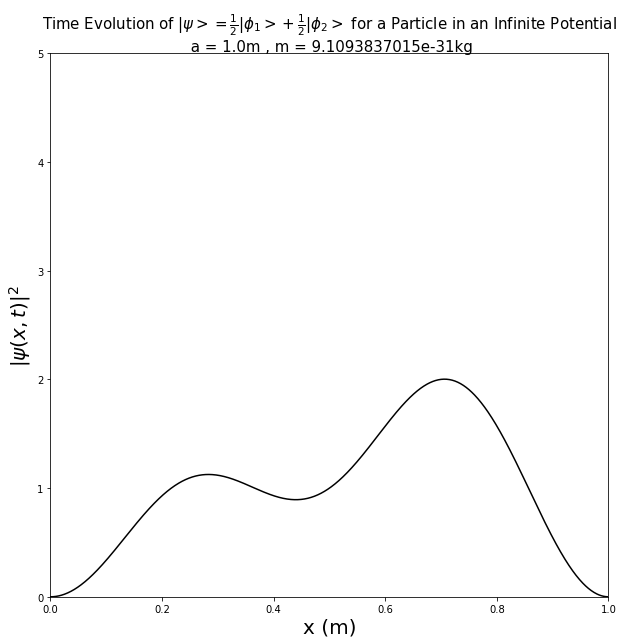

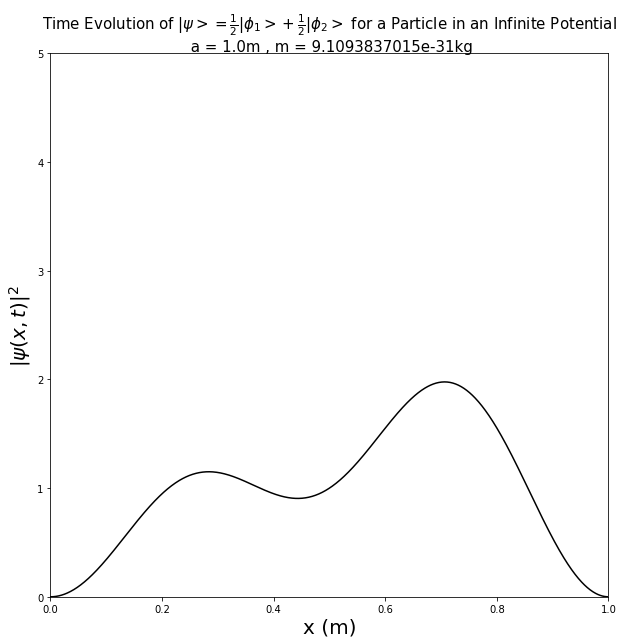

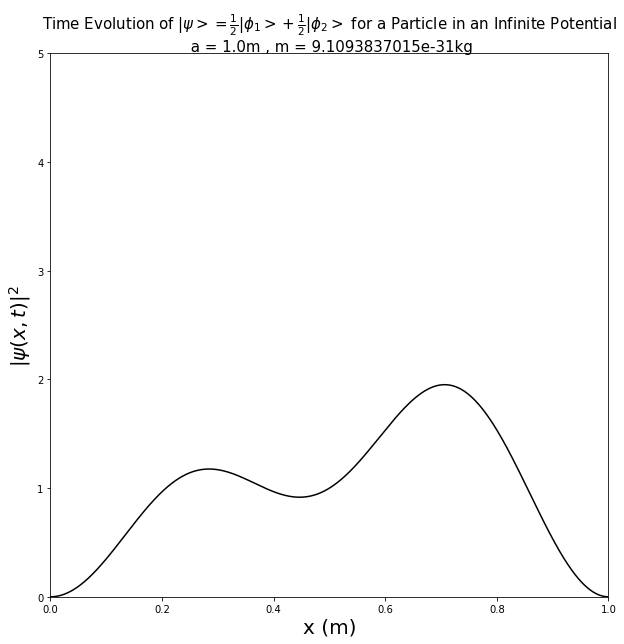

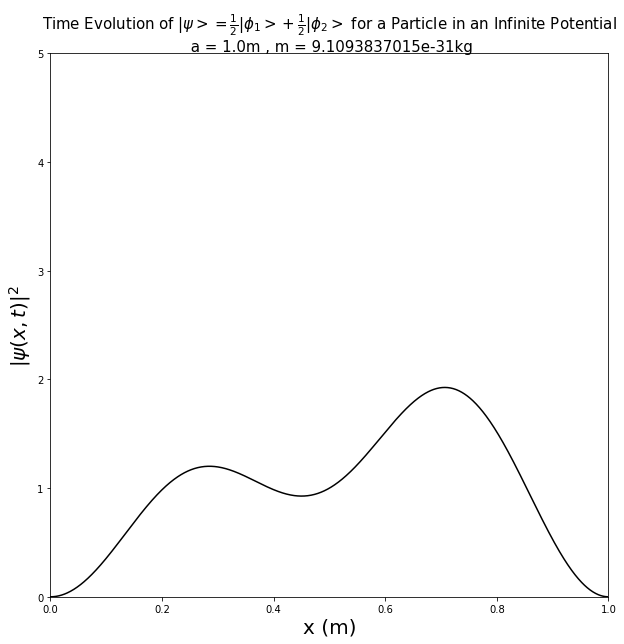

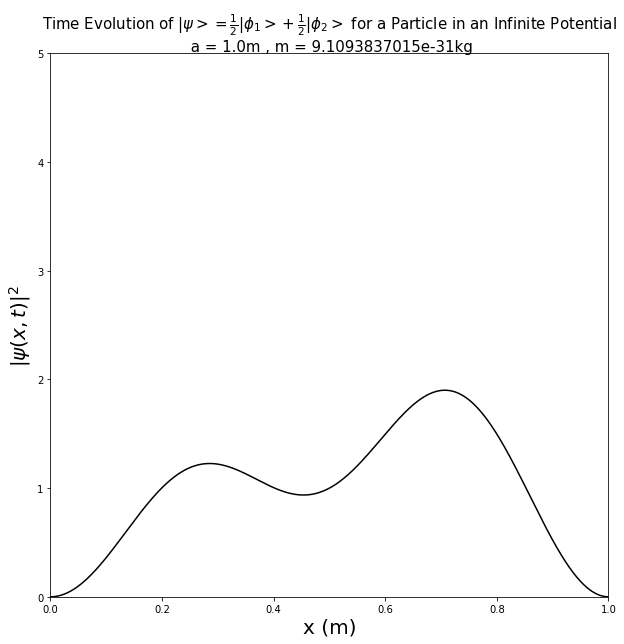

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.constants as constants
from html_movie import movie
import math
from time import perf_counter 

#####################################################################################
# The following discussion refers to the time evolution of a particle in an infinite
# potential well as discussed in Cohen-Tannoudji Complement A_III. A particle in its
# initial state, |psi(t=0)> is represented by the linear combination of eigenkets 
# |phi_1> and |phi_2> . From (D-54) of chapter III of Cohen-Tannoudji we can 
# describe the time evolution of the wavefunction by multiplying each eigenstate
# by a complex exponential with the time t and the respective energy eigenavalue
# in the exponent. With |psi > = 1/sqrt(2)[|phi_1> + |phi_2>] when we calculate
# the time evolution of its probability density, we have:
#
# |psi(x, t)|^2 = 1/2(phi_1(x))^2 + 1/2(phi_2(x))^2 + phi_1(x)phi_2(x)cos(w_21*t)
#
# where w_21 is given by w_21 = (3*pi^2*h_bar)/(2*m*a^2) where a is the length of the 
# well and m is the mass of the particle in question
#####################################################################################

# Initiating our timer 
t1_start = perf_counter()  

# Mass of an electron within an infinite potential well
# Declaring our position space in increments of (a/1000)m
m = constants.m_e
a = 1.0 
x = np.arange(0, a, a/1000)

# Eigenstates phi_1 and phi_2
phi_1 = math.sqrt(2/a)*np.sin((np.pi/a)*x)
phi_2 = math.sqrt(2/a)*np.sin(((2*np.pi)/a)*x)

# Angular frequency of cross term responsible for the
# time evolution of the shape of the wave packet
w_21 = (3*constants.hbar*(np.pi)**2)/(2*m*(a)**2)

# Setting up our time range in increments of dt
dt = 10
t_total = 3000
t = np.arange(0, t_total, dt)

# This defines the file names for the frames of the movie.
# The frames are numbered in order starting with 000
# {:03d} will display integers with three digits and insert zeros if needed:
# '000_movie.jpg', '001_movie.jpg', etc.
# if you need to have more frames in your movie, you will need to modify this line
file_name = "{:03d}_movie.jpg"


for i in range(t.size):
    
    # Our Probability distribution for the time evolution of the wave
    # packet
    prob_dist = 0.5*(phi_1)**2 + 0.5*(phi_2)**2 + phi_1*phi_2*np.cos(w_21*t[i])
    
    # Create a plot of the particle's position up to the current time with title, axes labels
    fig, ax = plt.subplots(figsize=(10.0, 10.0))
    plt.clf()
    
    plt.plot(x, prob_dist, c="k")
    plt.ylabel(r'$\|\psi(x,t)|^{2}$', fontsize=20.0)
    plt.xlabel('x (m)', fontsize=20.0)

    # We set the limits of this plot so all of the points will be displayed (so the axes don't change
    # during the movie)
    plt.xlim(0.0, a)
    plt.ylim(0.0, 5)
    
    # Add a title to the plot
    plt.title('Time Evolution of ' + r'$\|\psi > = \frac{1}{2}|\phi_{1} > + \frac{1}{2}|\phi_{2} >$' 
              + ' for a Particle in an Infinite Potential' +
              '\n a = {0}m , m = {1}kg'.format(str(a), str(m)), fontsize=15.0)
    
    # Save the file in the format given above -- number followed by _movie.jpg
    plt.savefig(file_name.format(i)) 

# Use html movie encoder from scitools to create an HTML document that
# will display the frames as a movie. 
# You will be able to open the file movie.html in a Web browser to view it. 
# Use the controls to start the movie.
movie(input_files='*_movie.jpg', output_file='infinitepotentialwell.html')

# Stopping our timer
t1_stop = perf_counter() 

# Displaying performance stats
print("Elapsed time during the whole program in seconds:", 
                                        t1_stop-t1_start) 


In [16]:
rm *movie.jpg

In [17]:
rm *html